In [18]:
import numpy as np
import matplotlib.pyplot as plt

In [24]:
#constants and initials
n = 3 #Glen's constant
ts = 100 #timesteps
b_0 = 500 #m 
x_m = 20000 #m
x_s = 7000 #m
m_0 = 2 #m/yr
A = 1e-16
n = 3
g = 9.81
rho = 910
gamma = 2*A*(rho*g)**n/(n+2)
dx=200 #spatial resolution
dt=1
cstab = 0.165
t_total = 5000
Nt = t_total/dt

In [25]:
x = np.arange(0, x_m+x_m/2+dx, dx) #create space vector

In [26]:
B = np.zeros(len(x)) #Bed height vector
B[x<x_s]=b_0 #defines the cliff edge

In [30]:
s=B #initial condition
Nx = len(s)

#mass balance equation 54
mdot = ((n*m_0)/(x_m**(2.*n-1.)))*x**(n-1.)*(abs(x_m-x)**(n-1.))*(x_m-2.*x)
mdot[x>x_m] = 0.

#define k
k = np.arange(0,Nx)
kp = np.hstack([np.arange(1,Nx),Nx-1])
kpp = np.hstack([np.arange(2,Nx),Nx-1,Nx-1])
km = np.hstack([0,np.arange(0,Nx-1)])
kmm = np.hstack([0,0,np.arange(0,Nx-2)])


[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150]


<ipython-input-32-6c6ec115944a>:9: RuntimeWarning: invalid value encountered in true_divide
  r_up_minus = (h[k] - h[km])/(h[kp] - h[k]) #equation 27
<ipython-input-32-6c6ec115944a>:14: RuntimeWarning: invalid value encountered in true_divide
  r_up_plus = (h[kp] - h[k])/(h[kpp] - h[kp]) #equation 27
<ipython-input-32-6c6ec115944a>:20: RuntimeWarning: invalid value encountered in true_divide
  r_down_minus = (h[km] - h[kmm])/(h[k] - h[km])
<ipython-input-32-6c6ec115944a>:25: RuntimeWarning: invalid value encountered in true_divide
  r_down_plus = (h[k] - h[km])/(h[kp] - h[k]) #equation 27
<ipython-input-32-6c6ec115944a>:67: RuntimeWarning: divide by zero encountered in double_scalars
  dt_stab = cstab * dx**2 / max(max(abs(D_up)),max(abs(D_down)))
<ipython-input-32-6c6ec115944a>:9: RuntimeWarning: divide by zero encountered in true_divide
  r_up_minus = (h[k] - h[km])/(h[kp] - h[k]) #equation 27
<ipython-input-32-6c6ec115944a>:9: RuntimeWarning: invalid value encountered in true_divide

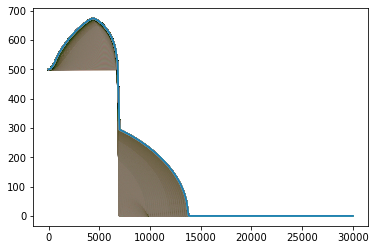

In [32]:
# calculate h

for i in range(t_total):
    stab_t = 0
    while stab_t < dt:
        h = s-B
    
        # k+1/2 boundary
        r_up_minus = (h[k] - h[km])/(h[kp] - h[k]) #equation 27
        phi = np.maximum(0,np.minimum(1,r_up_minus)) #equation 28
        h_up_minus = h[k] + 0.5*phi*(h[kp]-h[k]) #equation 23
        #print(h_up_minus)
    
        r_up_plus = (h[kp] - h[k])/(h[kpp] - h[kp]) #equation 27
        phi = np.maximum(0,np.minimum(1,r_up_plus)) #equation 28
        h_up_plus = h[k] - 0.5*phi*(h[kpp]-h[k]) #Equation 24
        #print(h_up_plus)
    
        # k-1/2 boundary
        r_down_minus = (h[km] - h[kmm])/(h[k] - h[km]) 
        phi = np.maximum(0,np.minimum(1,r_down_minus)) #equation 28
        h_down_minus = h[km] + 0.5*phi*(h[k]-h[km]) 
        #print(h_down_minus)
    
        r_down_plus = (h[k] - h[km])/(h[kp] - h[k]) #equation 27
        phi = np.maximum(0,np.minimum(1,r_down_plus)) #equation 28
        h_down_plus = h[k] - 0.5*phi*(h[kp]-h[k]) #Equation 26
        #print(h_down_plus)
    
        #Define flux terms at k+1/2 boundary
        S_up = ((s[kp]-s[k])/dx)**(n-1)
        D_up_plus = gamma*h_up_plus**(n+2)*S_up #equation 30
        D_up_minus = gamma*h_up_minus**(n+2)*S_up 
    
        D_up_min = np.minimum(D_up_plus, D_up_minus)
        #print(D_up_min)
        D_up_max = np.maximum(D_up_plus, D_up_minus)
        #print(D_up_max)
        D_up = np.zeros(Nx) #create array of 0s
    
        #equation 33
        D_up[np.logical_and(s[kp]<=s[k], h_up_minus <= h_up_plus)] = D_up_min[np.logical_and(s[kp]<=s[k], h_up_minus <= h_up_plus)]
        D_up[np.logical_and(s[kp]<=s[k], h_up_minus > h_up_plus)] = D_up_max[np.logical_and(s[kp]<=s[k], h_up_minus > h_up_plus)]
        D_up[np.logical_and(s[kp]>s[k], h_up_minus <= h_up_plus)] = D_up_max[np.logical_and(s[kp]>s[k], h_up_minus <= h_up_plus)]
        D_up[np.logical_and(s[kp]>s[k], h_up_minus > h_up_plus)] = D_up_min[np.logical_and(s[kp]>s[k], h_up_minus > h_up_plus)]
        #print(D_up)
    
        #define flux terms at k-1/2 boundary
        S_down = np.abs((s[k]-s[km])/dx)**(n-1)
        D_down_plus = gamma*h_down_plus**(n+2)*S_down
        D_down_minus = gamma*h_down_minus**(n+2)*S_down
    
        D_down_min = np.minimum(D_down_plus, D_down_minus)
        #print(D_down_min)
        D_down_max = np.maximum(D_down_plus, D_down_minus)
        #print(D_down_max)
    
        D_down = np.zeros(Nx) #create array of 0s
    
        #equation 33
        D_down[np.logical_and(s[kp]<=s[k], h_down_minus <= h_down_plus)] = D_down_min[np.logical_and(s[kp]<=s[k], h_down_minus <= h_down_plus)]
        D_down[np.logical_and(s[kp]<=s[k], h_down_minus > h_down_plus)] = D_down_max[np.logical_and(s[kp]<=s[k], h_down_minus > h_down_plus)]
        D_down[np.logical_and(s[kp]>s[k], h_down_minus <= h_down_plus)] = D_down_max[np.logical_and(s[kp]>s[k], h_down_minus <= h_down_plus)]
        D_down[np.logical_and(s[kp]>s[k], h_down_minus > h_down_plus)] = D_down_min[np.logical_and(s[kp]>s[k], h_down_minus > h_down_plus)]

        #Equation 37      
        dt_stab = cstab * dx**2 / max(max(abs(D_up)),max(abs(D_down)))      
        dt_use = min(dt_stab,dt-stab_t)
        stab_t = stab_t + dt_use
    
        #equation 35
        diff_up = D_up*(s[kp]-s[k])/dx
        diff_down = D_down*(s[k]-s[km])/dx
        diff = (diff_up-diff_down)/dx
        s = s[k] + (mdot +diff)*dt_use
        s = np.maximum(s,B)
        #print(s)
        
        h = s-B
    
        plt.plot(x,s)
plt.show()    